In [1]:
%matplotlib inline
%reload_ext autoreload
%autoreload 

In [2]:
import jovian
from fastai.vision import *
import pandas as pd
import numpy as np

<IPython.core.display.Javascript object>

## Read Dataset Files

In [3]:
# get_category_names
with open('list_category_cloth.txt', 'r') as f:
    categories = []
    for i, line in enumerate(f.readlines()):
        if i > 1:
            categories.append(line.split(' ')[0])

In [4]:
# get image category map
with open('list_category_image.txt', 'r') as f:
    images = []
    for i, line in enumerate(f.readlines()):
        if i > 1:
            images.append([word.strip() for word in line.split(' ') if len(word) > 0])

In [5]:
#get train, valid, test split
with open('list_eval_partition.txt', 'r') as f:
    images_partition = []
    for i, line in enumerate(f.readlines()):
        if i > 1:
            images_partition.append([word.strip() for word in line.split(' ') if len(word) > 0])

In [6]:
data_df = pd.DataFrame(images, columns=['images', 'category_label'])
partition_df = pd.DataFrame(images_partition, columns=['images', 'dataset'])

In [7]:
data_df['category_label'] = data_df['category_label'].astype(int)

In [8]:
data_df = data_df.merge(partition_df, on='images')

In [9]:
data_df['dataset'].value_counts()

train    209222
val       40000
test      40000
Name: dataset, dtype: int64

In [10]:
data_df['category'] = data_df['category_label'].apply(lambda x: categories[int(x) - 1])

In [11]:
data_df['category_label'].nunique()
# seems like few labels were merged in Dress label

46

In [12]:
data_df.head()

,images,category_label,dataset,category
0,img/Sheer_Pleated-Front_Blouse/img_00000001.jpg,3,train,Blouse
1,img/Sheer_Pleated-Front_Blouse/img_00000002.jpg,3,train,Blouse
2,img/Sheer_Pleated-Front_Blouse/img_00000003.jpg,3,val,Blouse
3,img/Sheer_Pleated-Front_Blouse/img_00000004.jpg,3,train,Blouse
4,img/Sheer_Pleated-Front_Blouse/img_00000005.jpg,3,test,Blouse


## prepare DataBunch

In [13]:
from pathlib import Path
images_path = Path('/home/jupyter/deepFashion')

In [14]:
data_source = (ImageList.from_df(df=data_df, path=images_path, cols='images')
                    .split_by_idxs((data_df[data_df['dataset']=='train'].index), (data_df[data_df['dataset']=='val'].index))
                    .label_from_df(cols='category')
              )

In [15]:
tmfs = get_transforms()

data = data_source.transform(tmfs, size=224).databunch(bs=128).normalize(imagenet_stats)

In [16]:
test_data = ImageList.from_df(df=data_df[data_df['dataset'] == 'test'], path=images_path, cols='images')
data.add_test(test_data)

In [17]:
# To maintain the order of images in train data, turning off shuffle
# data.train_dl = data.train_dl = data.train_dl.new(shuffle=False)

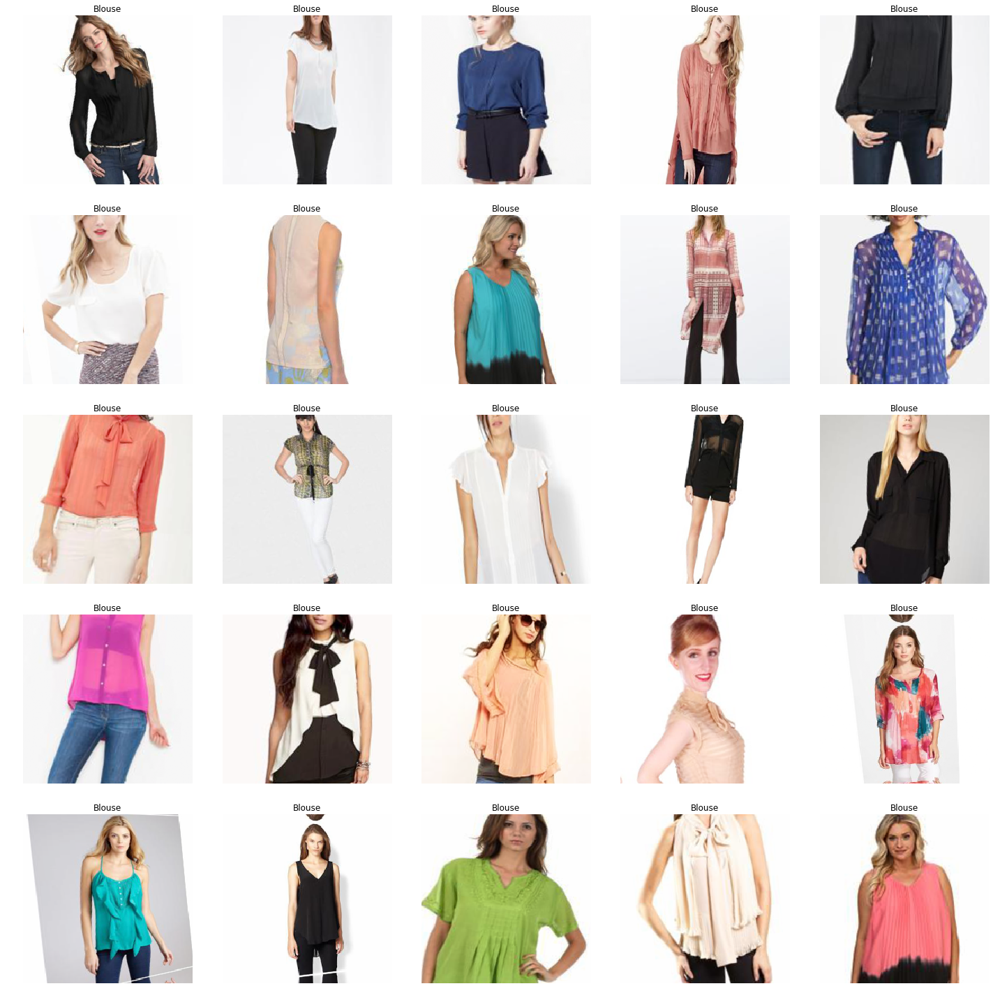

In [23]:
data.show_batch()

In [18]:
data

ImageDataBunch;

Train: LabelList (209222 items)
x: ImageList
Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224)
y: CategoryList
Blouse,Blouse,Blouse,Blouse,Blouse
Path: /home/jupyter/deepFashion;

Valid: LabelList (40000 items)
x: ImageList
Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224)
y: CategoryList
Blouse,Blouse,Blouse,Blouse,Blouse
Path: /home/jupyter/deepFashion;

Test: LabelList (40000 items)
x: ImageList
Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224)
y: EmptyLabelList
,,,,
Path: /home/jupyter/deepFashion

## ResNet50 pretrained model

In [19]:
from fastai.metrics import accuracy, top_k_accuracy

top_3_accuracy = partial(top_k_accuracy, k=3)
top_5_accuracy = partial(top_k_accuracy, k=5)

In [20]:
learner = cnn_learner(data, models.resnet152, metrics=[accuracy, top_3_accuracy, top_5_accuracy])
learner.model = torch.nn.DataParallel(learner.model)

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


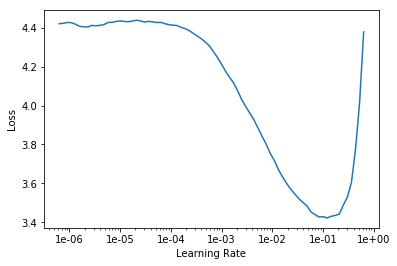

In [25]:
learner.lr_find()
learner.recorder.plot()

In [26]:
learner.fit_one_cycle(10, max_lr=1e-03)

epoch,train_loss,valid_loss,accuracy,top_k_accuracy,top_k_accuracy,time
0,1.538229,1.293813,0.628750,0.838200,0.907125,23:38
1,1.327644,1.198451,0.647325,0.853175,0.920200,23:35
2,1.305184,1.154403,0.660775,0.861350,0.925325,23:33
3,1.254822,1.128241,0.668025,0.866075,0.929050,23:32
4,1.218913,1.108451,0.676125,0.871200,0.931800,23:31
5,1.149093,1.072270,0.685550,0.876425,0.935100,23:30
6,1.153727,1.056559,0.690375,0.880525,0.937875,23:31
7,1.099121,1.046510,0.692975,0.881925,0.938575,23:30
8,1.095606,1.035576,0.697075,0.883850,0.939575,23:30
9,1.076328,1.035573,0.697000,0.884050,0.939825,23:31


In [21]:
learner.save('resnet50-224-freezed')

In [22]:
# .module because DataParallel was used
model = learner.model.module

## Get image feature vectors

In [23]:
class Hook():
    "Create a hook on `m` with `hook_func`."
    def __init__(self, m:nn.Module, hook_func:HookFunc, is_forward:bool=True, detach:bool=True):
        self.hook_func,self.detach,self.stored = hook_func,detach,None
        f = m.register_forward_hook if is_forward else m.register_backward_hook
        self.hook = f(self.hook_fn)
        self.removed = False

    def hook_fn(self, module:nn.Module, input:Tensors, output:Tensors):
        "Applies `hook_func` to `module`, `input`, `output`."
        if self.detach:
            input  = (o.detach() for o in input ) if is_listy(input ) else input.detach()
            output = (o.detach() for o in output) if is_listy(output) else output.detach()
        self.stored = self.hook_func(module, input, output)

    def remove(self):
        "Remove the hook from the model."
        if not self.removed:
            self.hook.remove()
            self.removed=True

    def __enter__(self, *args): return self
    def __exit__(self, *args): self.remove()
        
def get_output(module, input_value, output):
    return output.flatten(1)

def get_input(module, input_value, output):
    return list(input_value)[0]

def get_named_module_from_model(model, name):
    for n, m in model.named_modules():
        if n == name:
            return m
    return None

In [24]:
linear_output_layer = get_named_module_from_model(model, '1.4')
linear_output_layer

Linear(in_features=4096, out_features=512, bias=True)

In [25]:
# getting all images in train
train_valid_images_df = data_df[data_df['dataset'] != 'test']
inference_data_source = (ImageList.from_df(df=train_valid_images_df, path=images_path, cols='images')
                    .split_none()
                    .label_from_df(cols='category')
              )

In [26]:
inference_data = inference_data_source.transform(tmfs, size=224).databunch(bs=32).normalize(imagenet_stats)

In [27]:
inference_dataloader = inference_data.train_dl.new(shuffle=False)

In [28]:
import time
img_repr_map = {}

with Hook(linear_output_layer, get_output, True, True) as hook:
    start = time.time()
    for i, (xb, yb) in enumerate(inference_dataloader):
        bs = xb.shape[0]
        img_ids = inference_dataloader.items[i*bs: (i+1)*bs]
        result = model.eval()(xb)
        img_reprs = hook.stored.cpu().numpy()
        img_reprs = img_reprs.reshape(bs, -1)
        for img_id, img_repr in zip(img_ids, img_reprs):
            img_repr_map[img_id] = img_repr
        if(len(img_repr_map) % 12800 == 0):
            end = time.time()
            print(f'{end-start} secs for 12800 images')
            start = end

101.24369764328003 secs for 12800 images
98.39500021934509 secs for 12800 images
98.34056282043457 secs for 12800 images
98.28910255432129 secs for 12800 images
98.26451420783997 secs for 12800 images
98.4065248966217 secs for 12800 images
98.3215970993042 secs for 12800 images
98.29995536804199 secs for 12800 images
98.51958012580872 secs for 12800 images
98.27429819107056 secs for 12800 images
98.26910209655762 secs for 12800 images
98.11177659034729 secs for 12800 images
98.22765445709229 secs for 12800 images
98.18008756637573 secs for 12800 images
98.19500017166138 secs for 12800 images
98.28151893615723 secs for 12800 images
98.26829481124878 secs for 12800 images
98.30938339233398 secs for 12800 images
98.51196026802063 secs for 12800 images


In [29]:
img_repr_df = pd.DataFrame(img_repr_map.items(), columns=['img_id', 'img_repr'])

In [30]:
img_repr_df.shape

(249216, 2)

In [31]:
img_repr_df['label'] = [inference_data.classes[x] for x in inference_data.train_ds.y.items[0:img_repr_df.shape[0]]]

In [32]:
img_repr_df['label_id'] = inference_data.train_ds.y.items[0:img_repr_df.shape[0]]

## Getting similar images with cosine distance

In [40]:
from scipy.spatial.distance import cosine

def get_similar_images(img_index, n=10):
    start = time.time()
    base_img_id, base_vector, base_label  = img_repr_df.iloc[img_index, [0, 1, 2]]
    cosine_similarity = 1 - img_repr_df['img_repr'].apply(lambda x: cosine(x, base_vector))
    similar_img_ids = np.argsort(cosine_similarity)[-11:-1][::-1]
    end = time.time()
    print(f'{end - start} secs')
    return base_img_id, base_label, img_repr_df.iloc[similar_img_ids]

def show_similar_images(similar_images_df):
    images = [open_image(img_id) for img_id in similar_images_df['img_id']]
    categories = [learner.data.train_ds.y.reconstruct(y) for y in similar_images_df['label_id']]
    return learner.data.show_xys(images, categories)

In [44]:
base_image, base_label, similar_images_df = get_similar_images(30000)

9.765949010848999 secs


Hoodie
/home/jupyter/deepFashion/img/Sleeveless_Zip-Front_Hoodie/img_00000002.jpg


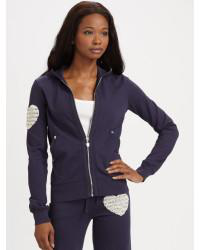

In [45]:
print(base_label)
print(base_image)
open_image(base_image)

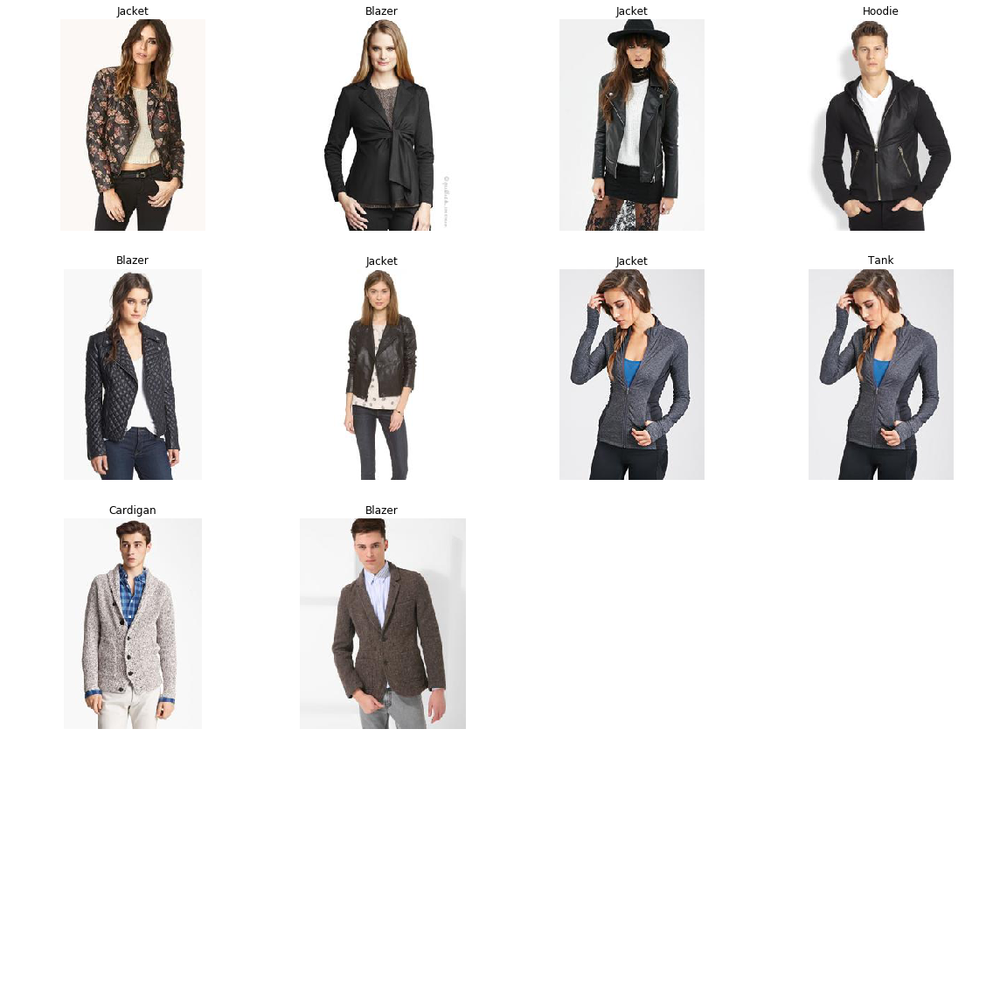

In [46]:
show_similar_images(similar_images_df)

## TSNE plot

In [222]:
from sklearn.manifold import TSNE

img_repr_matrix = [list(x) for x in img_repr_df['img_repr'].values]
tsne = TSNE(n_components=3, verbose=10, init='pca', perplexity=30, n_iter=500, n_iter_without_progress=100)
tsne_results_3 = tsne.fit_transform(img_repr_matrix)

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 40000 samples in 2.165s...
[t-SNE] Computed neighbors for 40000 samples in 2035.820s...
[t-SNE] Computed conditional probabilities for sample 1000 / 40000
[t-SNE] Computed conditional probabilities for sample 2000 / 40000
[t-SNE] Computed conditional probabilities for sample 3000 / 40000
[t-SNE] Computed conditional probabilities for sample 4000 / 40000
[t-SNE] Computed conditional probabilities for sample 5000 / 40000
[t-SNE] Computed conditional probabilities for sample 6000 / 40000
[t-SNE] Computed conditional probabilities for sample 7000 / 40000
[t-SNE] Computed conditional probabilities for sample 8000 / 40000
[t-SNE] Computed conditional probabilities for sample 9000 / 40000
[t-SNE] Computed conditional probabilities for sample 10000 / 40000
[t-SNE] Computed conditional probabilities for sample 11000 / 40000
[t-SNE] Computed conditional probabilities for sample 12000 / 40000
[t-SNE] Computed conditional probabilities for 

In [224]:
img_repr_df['tsne1'] = tsne_results_3[:,0]
img_repr_df['tsne2'] = tsne_results_3[:,1]
img_repr_df['tsne3'] = tsne_results_3[:,2]

In [225]:
img_repr_df.to_parquet('deepFashion_similar_images')

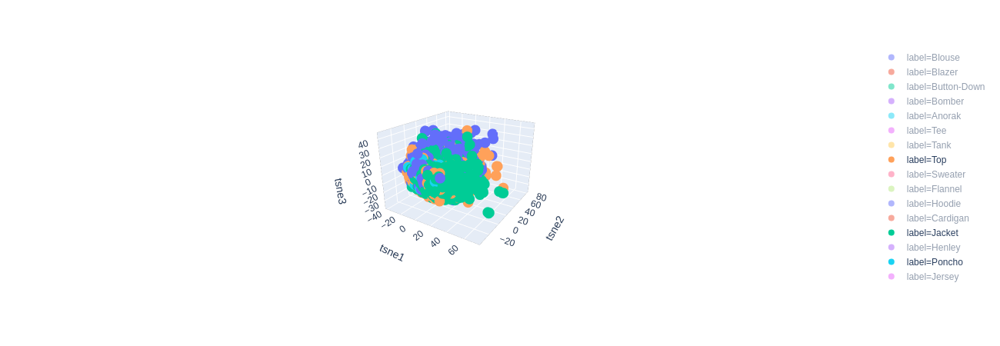

In [226]:
import plotly_express as px
px.scatter_3d(img_repr_df, x='tsne1', y='tsne2', z='tsne3', color='label')

## Using Annoy - Approximate Nearest Neighbors Oh Yeah!

In [33]:
from annoy import AnnoyIndex

In [34]:
f = len(img_repr_df['img_repr'][0])
t = AnnoyIndex(f, metric='euclidean')

In [35]:
for i, vector in enumerate(img_repr_df['img_repr']):
    t.add_item(i, vector)
_  = t.build(inference_data.c)

In [36]:
def get_similar_images_annoy(img_index):
    start = time.time()
    base_img_id, base_vector, base_label  = img_repr_df.iloc[img_index, [0, 1, 2]]
    similar_img_ids = t.get_nns_by_item(img_index, 13)
    end = time.time()
    print(f'{(end - start) * 1000} ms')
    return base_img_id, base_label, img_repr_df.iloc[similar_img_ids[1:]]

In [148]:
# 230000, 130000, 190000
base_image, base_label, similar_images_df = get_similar_images_annoy(149999)

2.244234085083008 ms


Shorts


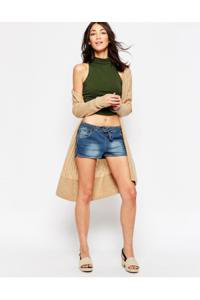

In [149]:
print(base_label)
open_image(base_image)

In [150]:
similar_images_df

,img_id,img_repr,label,label_id
28981,/home/jupyter/deepFashion/img/Side-Knot_Muscle...,"[0.0, 0.0, 0.0, 1.6202332, 0.7649524, 0.048360...",Tee,42
177982,/home/jupyter/deepFashion/img/Brushstroke_Prin...,"[0.0, 0.0, 0.18737155, 0.98211014, 1.9038566, ...",Dress,13
126755,/home/jupyter/deepFashion/img/Button_Fly_Denim...,"[0.0, 0.0, 0.0, 0.9619822, 1.312715, 0.0, 0.0,...",Shorts,36
15144,/home/jupyter/deepFashion/img/Dusty_Rose_Blous...,"[0.0, 0.0, 0.0, 0.7653293, 0.52301735, 0.0, 0....",Blouse,2
170164,/home/jupyter/deepFashion/img/Daisy_Dot_Denim_...,"[0.0, 0.0, 0.0, 0.44035482, 0.74691516, 0.0, 0...",Shorts,36
143897,/home/jupyter/deepFashion/img/High-Waisted_Den...,"[0.0, 0.0, 0.0, 1.5010501, 1.4306499, 0.0, 0.0...",Skirt,37
131994,/home/jupyter/deepFashion/img/Abstract_Mandala...,"[0.0, 0.0, 0.0, 0.6999126, 0.82230794, 0.36071...",Skirt,37
113810,/home/jupyter/deepFashion/img/Raw-Cut_Fringe_T...,"[0.0, 0.0, 0.0, 0.88964194, 1.4405713, 0.0, 0....",Tee,42
132957,/home/jupyter/deepFashion/img/Cloud_Wash_Denim...,"[0.0, 0.0, 0.0, 0.5640916, 0.41313827, 0.05875...",Shorts,36
168402,/home/jupyter/deepFashion/img/Classic_Wash_Den...,"[0.0, 0.0, 0.7087143, 0.9417487, 1.7582346, 0....",Skirt,37


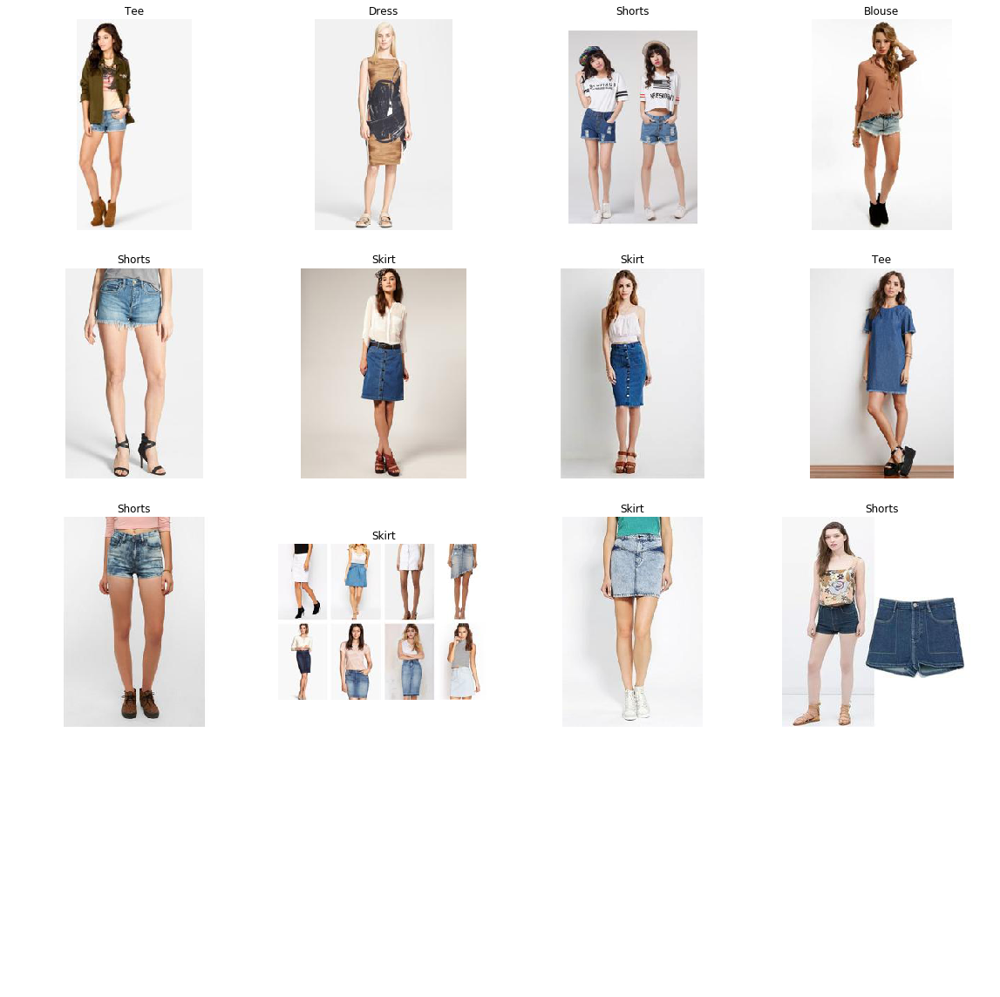

In [151]:
show_similar_images(similar_images_df)

In [264]:
jovian.commit()

[jovian] Saving notebook..


<IPython.core.display.Javascript object>

[jovian] Creating a new notebook on https://jvn.io
[jovian] Uploading notebook..
[jovian] Capturing environment..
[jovian] Committed successfully! https://jvn.io/gautham20/e6bd87b3597e4a12bb601216b4d2289d
